### Capstone Project - (Week 2)
##### Applied Data Science Capstone by IBM/Coursera

#### Table of Contents



<font size = 3>

1. <a href="#item1">Business Problem</a>

2. <a href="#item2">Data</a>

3. <a href="#item3">Methodology</a>

4. <a href="#item4">Analysis</a>

5. <a href="#item5">Results and discussion</a>  

6. <a href="#item5">Conclusion</a>   
</font>


## Business Problem

Chicago is a very diverse city and one of the largest in the US. When it comes to food, the city has a lot to offer. 
For instance, every year in July, the city hosts a food festival called “Taste of Chicago”. It is held for five days in Grant Park, one of the biggest park downtown. The event is the largest festival in Chicago. During this event, one can experience some local specialties as well as some ethnic food. 

However, during the remainder of the year, one might be wondering where to find the best ethnic restaurant in city. 
The city has about 200 neighborhoods and about 77 community areas. With a population of more than 2.7 million, it may not be easy to decide where to open a new restaurant if one wanted to. 

In this project, I will build a map of Chicago showing the population density per area, then I will explore the different type of restaurants available and finally see where one could open a new “ethnic” restaurant. 


## Data

After a few hours of research, I was able to find the following is a link of some US city with their local areas and geolocations. 

https://geo.nyu.edu/catalog/stanford-xq082nw3443

I will exploit this file to extract the relevant data pertaining to Chicago. 
 

We will also use the foursquare API, with the credentials we created during the lab session on foursquare to explore the different areas and cluster them. 

Finally, we may use geocoder if needed as we move along with the project. 



## Methodology

We first import the necessary libraries that we will need


In [1]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

#!conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

#!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library

print('Libraries imported.')

Libraries imported.


We now download the data. 

I took the data from the webpage above and store it locally on my computer for convenience. 

In [18]:
!wget -q -O 'stanford-xq082nw3443-geojson.json' https://geo.nyu.edu/catalog/stanford-xq082nw3443
print('Data downloaded!')

Data downloaded!


In [21]:
with open('stanford-xq082nw3443-geojson.json') as json_data:
     us_data = json.load(json_data)
   

In [22]:
neighborhoods_data = us_data['features']

In [23]:
neighborhoods_data[0]

{'type': 'Feature',
 'id': 'xq082nw3443.1',
 'geometry': {'type': 'MultiPolygon',
  'coordinates': [[[[-118.17196775, 33.81849272],
     [-118.17196775, 33.81928392],
     [-118.16801173, 33.81928392],
     [-118.16801173, 33.82007513],
     [-118.16563812, 33.82007513],
     [-118.16563812, 33.82007513],
     [-118.16484692, 33.82719596],
     [-118.1608909, 33.82719596],
     [-118.15772608, 33.82482235],
     [-118.15614367, 33.82482235],
     [-118.15535247, 33.82719596],
     [-118.15535247, 33.82719596],
     [-118.15377006, 33.82798717],
     [-118.15377006, 33.82877837],
     [-118.15218765, 33.82877837],
     [-118.15060524, 33.83194319],
     [-118.15060524, 33.83273439],
     [-118.14823163, 33.83273439],
     [-118.14506681, 33.83273439],
     [-118.1426932, 33.83273439],
     [-118.1426932, 33.83273439],
     [-118.1426932, 33.83036078],
     [-118.1426932, 33.82482235],
     [-118.13398996, 33.82561356],
     [-118.13398996, 33.82482235],
     [-118.13398996, 33.82403115]

#### Remark

As we can see from the sample above, the file contains in the properties, the following: 
    
   <b> 1) The State </b> (we will filter IL as this analysis is for Chicago)
    
   <b> 2) The City </b>, here we will analyze "Chicago"
    
   <b> 3) The neighborhood </b>, which can be found in the property "name"
    
   <b> 4) The population density </b>, in the "popdensity" property. 
    
The will extract these properties as well as the latitude and longitude of each neighborhood to construct the data frame that we will use. 

#### Building the Dataframe

In [24]:
column_names = ['State','City', 'Area', 'PopDensity','Latitude', 'Longitude'] 

# instantiate the dataframe
neighborhoods = pd.DataFrame(columns=column_names)

In [25]:
neighborhoods

,State,City,Area,PopDensity,Latitude,Longitude


Now let's extract the properties we are interested in, from the file. 

This will be done for all cities in the data set, but we will later filter to keep only data for Chicago. 

In [26]:
for data in neighborhoods_data:
    state_name = data['properties']['state'] 
    area_name = data['properties']['name']
    city_name = data['properties']['city']
    popdens = data['properties']['popdensity']
        
    neighborhood_lat = data['properties']['y']
    neighborhood_lon = data['properties']['x']
    
    neighborhoods = neighborhoods.append({'State': state_name,
                                          'City': city_name,
                                          'Area': area_name,
                                          'PopDensity': popdens,
                                          
                                          'Latitude': neighborhood_lat,
                                          'Longitude': neighborhood_lon}, ignore_index=True)

Let's see how the first few raws in the data set look like. 

In [27]:
neighborhoods.head()

,State,City,Area,PopDensity,Latitude,Longitude
0,CA,Long Beach,Airport Area,5741.323529,33.8167,-118.154496
1,CA,Long Beach,Alamitos Heights,7060.266667,33.7738,-118.125871
2,CA,Long Beach,Belmont Heights,15536.411111,33.7639,-118.151191
3,CA,Long Beach,Belmont Shore,13146.320000,33.7589,-118.137396
4,CA,Long Beach,Bixby Area,9901.688000,33.8405,-118.176421


In [28]:
scope = ['Chicago']


We define teh scope of our work as teh city of Chicago. This way we can filter the dataframe on this criteria. 

In [29]:
df_chi = neighborhoods.loc[neighborhoods['City'].isin(scope)]

In [30]:
df_chi.head()

,State,City,Area,PopDensity,Latitude,Longitude
730,IL,Chicago,Loop,17486.450000,41.8784,-87.625333
738,IL,Chicago,Chatham,12681.364151,41.7385,-87.616624
739,IL,Chicago,North Center,17814.894231,41.9473,-87.684523
740,IL,Chicago,O'hare,6591.975000,41.9633,-87.847436
741,IL,Chicago,Washington Park,13106.814286,41.7916,-87.617580


In [31]:
df_chi.shape

(77, 6)

As we can see, our final data set has 77 rows (ie 77 neighborhood areas)

In [33]:
print('The dataframe has {} area.'.format(
        len(df_chi['Area'].unique()),
    )
)

The dataframe has 77 area.


#### Use geopy library to get the latitude and longitude values of Chicago

In [34]:
address = 'Chicago, IL'

geolocator = Nominatim(user_agent="chi_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Chicago are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of Chicago are 41.8755616, -87.6244212.


Now we can create a map of chicago with the neighborhood areas superposed

In [35]:
chi_map = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, City, Area in zip(df_chi['Latitude'], df_chi['Longitude'], df_chi['Area'], df_chi['City']):
    label = '{}, {}'.format(Area, City)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(chi_map)  
    
chi_map

We are now ready to start utilizing the Foursquare API to explore the neighborhoods and segment them.


* I will use the Foursquare credentials created during the Lab session

In [36]:
CLIENT_ID = 'WPDQ1LUK52J3XPB0ZGW41CG2Q0VV5550HECBCUWIHL5APPIH' # your Foursquare ID
CLIENT_SECRET = 'LTHRTMHRQCETAISSIDJYFGG3C1DMORK5FCMAKXQMZKFQIBMF' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: WPDQ1LUK52J3XPB0ZGW41CG2Q0VV5550HECBCUWIHL5APPIH
CLIENT_SECRET:LTHRTMHRQCETAISSIDJYFGG3C1DMORK5FCMAKXQMZKFQIBMF


Let's see the first area in our data frame

In [37]:
df_chi.loc[730, 'Area']

'Loop'

The "Loop" is the center of downtown Chicago, a little like the business center of the city. That is the first area in our data set. 

Let's get the geocoordinates of the Loop. 

In [38]:
loop_latitude = df_chi.loc[730, 'Latitude'] # neighborhood latitude value
loop_longitude = df_chi.loc[730, 'Longitude'] # neighborhood longitude value

neighborhood_name = df_chi.loc[730, 'Area'] # neighborhood name

print('Latitude and longitude values of {} are {}, {}.'.format(neighborhood_name, 
                                                               loop_latitude, 
                                                               loop_longitude))

Latitude and longitude values of Loop are 41.8784, -87.6253334187.


##### Now, let's get the top 100 venues that are in the Loop within a radius of 1500.

In [39]:
LIMIT = 100 # limit of number of venues returned by Foursquare API

radius = 1500 # define radius

# create URL
url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    loop_latitude, 
    loop_longitude, 
    radius, 
    LIMIT)
url # display URL


'https://api.foursquare.com/v2/venues/explore?&client_id=WPDQ1LUK52J3XPB0ZGW41CG2Q0VV5550HECBCUWIHL5APPIH&client_secret=LTHRTMHRQCETAISSIDJYFGG3C1DMORK5FCMAKXQMZKFQIBMF&v=20180605&ll=41.8784,-87.6253334187&radius=1500&limit=100'

In [41]:
results = requests.get(url).json()


We will use the get_category_type function to clean the data and put it into a dataframe

In [42]:
# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

In [43]:
venues = results['response']['groups'][0]['items']
    
nearby_venues = json_normalize(venues) # flatten JSON

# filter columns
filtered_columns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
nearby_venues =nearby_venues.loc[:, filtered_columns]

# filter the category for each row
nearby_venues['venue.categories'] = nearby_venues.apply(get_category_type, axis=1)

# clean columns
nearby_venues.columns = [col.split(".")[-1] for col in nearby_venues.columns]

nearby_venues.head()

,name,categories,lat,lng
0,The Art Institute of Chicago,Art Museum,41.879579,-87.623909
1,Symphony Center (Chicago Symphony Orchestra),Concert Hall,41.879275,-87.624680
2,Chicago Architecture Foundation,Museum,41.878556,-87.624550
3,Auditorium Theatre,Theater,41.876058,-87.625303
4,Thorne Miniature Rooms,Museum,41.879532,-87.623680


we see that the first few venues in the list are museums and theater. 

In [44]:
print('{} venues were returned by Foursquare.'.format(nearby_venues.shape[0]))

100 venues were returned by Foursquare.


In [45]:
nearby_venues['categories']

0                        Art Museum
1                      Concert Hall
2                            Museum
3                           Theater
4                            Museum
5                            Garden
6                               Pub
7                  Cuban Restaurant
8                  Arepa Restaurant
9                         Gastropub
10                            Hotel
11                      Snack Place
12                            Hotel
13                        Gastropub
14                       Smoke Shop
15                      Art Gallery
16                      Coffee Shop
17                              Bar
18                             Café
19              Arts & Crafts Store
20                           Hostel
21                         Fountain
22                          Theater
23              American Restaurant
24                      Coffee Shop
25                        Gift Shop
26                          Theater
27                          

## Explore Neighborhoods in Chicago

We will create a function to repeat the same process to all the neighborhoods in the city

In [48]:
def getNearbyVenues(names, latitudes, longitudes, radius=1500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Area', 
                  'Area Latitude', 
                  'Area Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [49]:
chicago_venues = getNearbyVenues(names=df_chi['Area'],
                                   latitudes=df_chi['Latitude'],
                                   longitudes=df_chi['Longitude']
                                  )

Loop
Chatham
North Center
O'hare
Washington Park
Garfield Ridge
Beverly
Ashburn
Forest Glen
Edison Park
Riverdale
Woodlawn
Lincoln Park
Englewood
Jefferson Park
Hermosa
Morgan Park
Near South Side
South Chicago
North Lawndale
Mount Greenwood
Fuller Park
Uptown
North Park
Dunning
East Side
West Englewood
Pottage Park
Edgewater
West Garfield Park
Roseland
Irving Park
Auburn Gresham
Chicago Lawn
West Town
Bridgeport
Hegewisch
Lower West Side
Brighton Park
Avalon Park
Burnside
South Shore
West Ridge
Belmont Cragin
New City
Oakland
Washington Heights
Albany Park
Douglas
West Pullman
Rogers Park
Pullman
West Lawn
Austin
Logan Square
Archer Heights
Near North Side
Lake View
West Elsdon
Avondale
Armour Square
Kenwood
Clearing
South Deering
Near West Side
Calumet Heights
Grand Boulevard
Norwood Park
Humboldt Park
Lincoln Square
Montclare
East Garfield Park
Hyde Park
South Lawndale
Gage Park
McKinley Park
Grand Crossing


In [50]:
print(chicago_venues.shape)
chicago_venues.head()

(5305, 7)


,Area,Area Latitude,Area Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Loop,41.8784,-87.625333,The Art Institute of Chicago,41.879579,-87.623909,Art Museum
1,Loop,41.8784,-87.625333,Symphony Center (Chicago Symphony Orchestra),41.879275,-87.624680,Concert Hall
2,Loop,41.8784,-87.625333,Chicago Architecture Foundation,41.878556,-87.624550,Museum
3,Loop,41.8784,-87.625333,Auditorium Theatre,41.876058,-87.625303,Theater
4,Loop,41.8784,-87.625333,Thorne Miniature Rooms,41.879532,-87.623680,Museum


We can check how many we have in each area

In [51]:
df_venues = chicago_venues.groupby('Area').count()

In [52]:
print('There are {} uniques categories.'.format(len(chicago_venues['Venue Category'].unique())))

There are 355 uniques categories.


In [53]:
%matplotlib inline 

import matplotlib as mpl
import matplotlib.pyplot as plt

In [54]:
df_venues.head()

,Area Latitude,Area Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Area,,,,,,
Albany Park,85,85,85,85,85,85
Archer Heights,65,65,65,65,65,65
Armour Square,100,100,100,100,100,100
Ashburn,58,58,58,58,58,58
Auburn Gresham,59,59,59,59,59,59


In [55]:
df_venues2=df_venues.reset_index()

In [56]:
df_venues2.head()

,Area,Area Latitude,Area Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Albany Park,85,85,85,85,85,85
1,Archer Heights,65,65,65,65,65,65
2,Armour Square,100,100,100,100,100,100
3,Ashburn,58,58,58,58,58,58
4,Auburn Gresham,59,59,59,59,59,59


In [57]:
df_venues3 = df_venues2[['Area', 'Venue']] 

In [58]:
df_venues3.head()

,Area,Venue
0,Albany Park,85
1,Archer Heights,65
2,Armour Square,100
3,Ashburn,58
4,Auburn Gresham,59


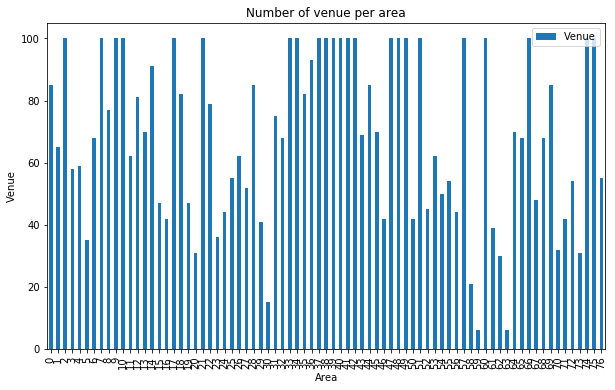

In [113]:
# let's plot data to see
df_venues3.plot(kind='bar', figsize=(10, 6))

plt.xlabel('Area') # add to x-label to the plot
plt.ylabel('Venue') # add y-label to the plot
plt.title('Number of venue per area') # add title to the plot

plt.show()

The plot is not really insightfull here as there are too many items. 

We will re-plot this with only restaurants.

#### Analyzing Each Neighborhood

In [59]:
# one hot encoding
chicago_onehot = pd.get_dummies(chicago_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
chicago_onehot['Area'] = chicago_venues['Area'] 

# move neighborhood column to the first column
fixed_columns = [chicago_onehot.columns[-1]] + list(chicago_onehot.columns[:-1])
chicago_onehot = chicago_onehot[fixed_columns]

chicago_onehot.head()

,Area,ATM,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport,Airport Service,Airport Terminal,American Restaurant,Amphitheater,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Botanical Garden,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bubble Tea Shop,Building,Burger Joint,Burmese Restaurant,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Café,Cajun / Creole Restaurant,Camera Store,Candy Store,Caribbean Restaurant,Check Cashing Service,Child Care Service,Chinese Restaurant,Chocolate Shop,Church,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Arts Building,College Bookstore,College Cafeteria,College Gym,College Quad,College Rec Center,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Cuban Restaurant,Cultural Center,Cupcake Shop,Currency Exchange,Cycle Studio,Czech Restaurant,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Dive Bar,Dog Run,Donut Shop,Dry Cleaner,Eastern European Restaurant,Electronics Store,Elementary School,Empanada Restaurant,Ethiopian Restaurant,Event Service,Exhibit,Eye Doctor,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Financial or Legal Service,Fish & Chips Shop,Fish Market,Fishing Spot,Flea Market,Flower Shop,Fondue Restaurant,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Football Stadium,Forest,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Golf Course,Golf Driving Range,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Heliport,Historic Site,History Museum,Hobby Shop,Hockey Arena,Home Service,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotpot Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Insurance Office,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kids Store,Kitchen Supply Store,Korean Restaurant,Lake,Latin American Restaurant,Laundromat,Lawyer,Library,Light Rail Station,Lighthouse,Lingerie Store,Liquor Store,Locksmith,Lounge,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Military Base,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Molecular Gastronomy Restaurant,Moroccan Restaurant,Motel,Mountain,Movie Theater,Moving Target,Multiplex,Museum,Music School,Music Store,Music Venue,Nail Salon,Nature Preserve,Neighborhood,New American Restaurant,Newsstand,Nightclub,Non-Profit,Noodle House,Office,Optical Shop,Organic Grocery,Other Great Outdoors,Outdoor Sculpture,Outdoors & Recreation,Outlet Store,Pakistani Restaurant,Paper / Office Supplies Store,Park,Parking,Pastry Shop,Pedestrian Plaza,Performing Arts Venue,Persian Restaurant,Peruvian Restaurant,Pet Service,Pet Store,Pharmacy,Photography Lab,Pie Shop,Pier,Pizza Place,Platform,Playground,Plaza,Poke Place,Polish Restaurant,Pool,Pool Hall,Post Office,Print Shop,Pub,Public Art,Ramen Restaurant,Record Shop,Recreation Center,Rental Car Location,Restaurant,Rock Club,Russian Resta

In [60]:
chicago_onehot.shape

(5305, 356)

This is a pretty large data set

We can group by area and take the mean occurence frequency of each category

In [61]:
chicago_grouped = chicago_onehot.groupby('Area').mean().reset_index()
chicago_grouped

,Area,ATM,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport,Airport Service,Airport Terminal,American Restaurant,Amphitheater,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Botanical Garden,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bubble Tea Shop,Building,Burger Joint,Burmese Restaurant,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Café,Cajun / Creole Restaurant,Camera Store,Candy Store,Caribbean Restaurant,Check Cashing Service,Child Care Service,Chinese Restaurant,Chocolate Shop,Church,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Arts Building,College Bookstore,College Cafeteria,College Gym,College Quad,College Rec Center,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Cuban Restaurant,Cultural Center,Cupcake Shop,Currency Exchange,Cycle Studio,Czech Restaurant,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Dive Bar,Dog Run,Donut Shop,Dry Cleaner,Eastern European Restaurant,Electronics Store,Elementary School,Empanada Restaurant,Ethiopian Restaurant,Event Service,Exhibit,Eye Doctor,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Financial or Legal Service,Fish & Chips Shop,Fish Market,Fishing Spot,Flea Market,Flower Shop,Fondue Restaurant,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Football Stadium,Forest,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Golf Course,Golf Driving Range,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Heliport,Historic Site,History Museum,Hobby Shop,Hockey Arena,Home Service,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotpot Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Insurance Office,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kids Store,Kitchen Supply Store,Korean Restaurant,Lake,Latin American Restaurant,Laundromat,Lawyer,Library,Light Rail Station,Lighthouse,Lingerie Store,Liquor Store,Locksmith,Lounge,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Military Base,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Molecular Gastronomy Restaurant,Moroccan Restaurant,Motel,Mountain,Movie Theater,Moving Target,Multiplex,Museum,Music School,Music Store,Music Venue,Nail Salon,Nature Preserve,Neighborhood,New American Restaurant,Newsstand,Nightclub,Non-Profit,Noodle House,Office,Optical Shop,Organic Grocery,Other Great Outdoors,Outdoor Sculpture,Outdoors & Recreation,Outlet Store,Pakistani Restaurant,Paper / Office Supplies Store,Park,Parking,Pastry Shop,Pedestrian Plaza,Performing Arts Venue,Persian Restaurant,Peruvian Restaurant,Pet Service,Pet Store,Pharmacy,Photography Lab,Pie Shop,Pier,Pizza Place,Platform,Playground,Plaza,Poke Place,Polish Restaurant,Pool,Pool Hall,Post Office,Print Shop,Pub,Public Art,Ramen Restaurant,Record Shop,Recreation Center,Rental Car Location,Restaurant,Rock Club,Russian Resta

In [62]:
chicago_grouped.shape

(77, 356)

We can check the top 10 venues in each area

In [63]:
num_top_venues = 10

for hood in chicago_grouped['Area']:
    print("----"+hood+"----")
    temp = chicago_grouped[chicago_grouped['Area'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Albany Park----
                       venue  freq
0                Pizza Place  0.05
1         Chinese Restaurant  0.05
2                Coffee Shop  0.05
3           Asian Restaurant  0.04
4                Supermarket  0.04
5          Korean Restaurant  0.04
6                       Park  0.04
7         Mexican Restaurant  0.04
8             Sandwich Place  0.02
9  Middle Eastern Restaurant  0.02


----Archer Heights----
                  venue  freq
0    Mexican Restaurant  0.08
1        Sandwich Place  0.06
2                   Bar  0.06
3     Mobile Phone Shop  0.06
4            Donut Shop  0.03
5           Coffee Shop  0.03
6        Cosmetics Shop  0.03
7  Fast Food Restaurant  0.03
8         Grocery Store  0.03
9                  Bank  0.03


----Armour Square----
                  venue  freq
0    Chinese Restaurant  0.19
1                   Bar  0.06
2           Pizza Place  0.05
3                Bakery  0.04
4    Mexican Restaurant  0.03
5     Korean Restaurant  0.03
6     

We can put this into a datframe for better analysis

In [64]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

This function sorts things in each area

In [65]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Area']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
area_venues_sorted = pd.DataFrame(columns=columns)
area_venues_sorted['Area'] = chicago_grouped['Area']

for ind in np.arange(chicago_grouped.shape[0]):
    area_venues_sorted.iloc[ind, 1:] = return_most_common_venues(chicago_grouped.iloc[ind, :], num_top_venues)

area_venues_sorted.head()

,Area,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Albany Park,Coffee Shop,Chinese Restaurant,Pizza Place,Asian Restaurant,Korean Restaurant,Supermarket,Park,Mexican Restaurant,Mobile Phone Shop,Pub
1,Archer Heights,Mexican Restaurant,Mobile Phone Shop,Bar,Sandwich Place,Discount Store,Fast Food Restaurant,Bank,Coffee Shop,Cosmetics Shop,Pizza Place
2,Armour Square,Chinese Restaurant,Bar,Pizza Place,Bakery,Park,Mexican Restaurant,Korean Restaurant,Coffee Shop,Hot Dog Joint,Sandwich Place
3,Ashburn,Park,Fast Food Restaurant,Fried Chicken Joint,Mexican Restaurant,Seafood Restaurant,Pizza Place,Discount Store,Intersection,Pharmacy,Liquor Store
4,Auburn Gresham,Discount Store,Seafood Restaurant,Lounge,Fast Food Restaurant,Pharmacy,Sandwich Place,Southern / Soul Food Restaurant,Nightclub,Bar,Train Station


#### Clustering Neighborhoods

In [66]:
# we set the initial number of clusters to 6
kclusters = 6

chicago_grouped_clustering = chicago_grouped.drop('Area', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(chicago_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([0, 5, 0, 2, 2, 0, 2, 0, 5, 2], dtype=int32)

Let's create a new dataframe that includes the cluster as well as the top 10 venues for each area.

In [67]:
# add clustering labels
area_venues_sorted.insert(0, 'Cluster label', kmeans.labels_)

chicago_merged = df_chi

# merge to add alatitude and longitude
chicago_merged = chicago_merged.join(area_venues_sorted.set_index('Area'), on='Area')

chicago_merged.head() # check the last columns!

,State,City,Area,PopDensity,Latitude,Longitude,Cluster label,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
730,IL,Chicago,Loop,17486.450000,41.8784,-87.625333,0,Hotel,Theater,Park,Coffee Shop,Gastropub,Snack Place,Museum,Pizza Place,Sandwich Place,Garden
738,IL,Chicago,Chatham,12681.364151,41.7385,-87.616624,2,Fast Food Restaurant,Sandwich Place,Women's Store,Discount Store,Mobile Phone Shop,Park,Department Store,Donut Shop,Shoe Store,Seafood Restaurant
739,IL,Chicago,North Center,17814.894231,41.9473,-87.684523,0,Bar,Pizza Place,Mexican Restaurant,Coffee Shop,Brewery,Salon / Barbershop,Beer Store,Cuban Restaurant,Soccer Field,Sushi Restaurant
740,IL,Chicago,O'hare,6591.975000,41.9633,-87.847436,2,Sandwich Place,Donut Shop,Grocery Store,Convenience Store,Fast Food Restaurant,American Restaurant,Bank,Sports Bar,Seafood Restaurant,Shipping Store
741,IL,Chicago,Washington Park,13106.814286,41.7916,-87.617580,2,Fast Food Restaurant,Coffee Shop,Train Station,Sandwich Place,Mobile Phone Shop,Grocery Store,Bus Station,Café,Restaurant,Fried Chicken Joint


We can now visualize clustering on a map

In [70]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(chicago_merged['Latitude'], chicago_merged['Longitude'], chicago_merged['Area'], chicago_merged['Cluster label']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

#### Let's examine clusters

In [71]:
chicago_merged.loc[chicago_merged['Cluster label'] == 0, chicago_merged.columns[[1] + list(range(5, chicago_merged.shape[1]))]]

,City,Longitude,Cluster label,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
730,Chicago,-87.625333,0,Hotel,Theater,Park,Coffee Shop,Gastropub,Snack Place,Museum,Pizza Place,Sandwich Place,Garden
739,Chicago,-87.684523,0,Bar,Pizza Place,Mexican Restaurant,Coffee Shop,Brewery,Salon / Barbershop,Beer Store,Cuban Restaurant,Soccer Field,Sushi Restaurant
746,Chicago,-87.758269,0,Park,Grocery Store,Gym,American Restaurant,Coffee Shop,Golf Course,Fast Food Restaurant,Bar,Sandwich Place,Trail
747,Chicago,-87.814438,0,Italian Restaurant,Fast Food Restaurant,Coffee Shop,Sushi Restaurant,Park,Sandwich Place,Pizza Place,Salon / Barbershop,Donut Shop,Bar
749,Chicago,-87.592747,0,Coffee Shop,Café,Park,Discount Store,Sandwich Place,History Museum,Outdoor Sculpture,Grocery Store,Bookstore,Pizza Place
750,Chicago,-87.650687,0,Italian Restaurant,Pizza Place,Sushi Restaurant,Coffee Shop,Hot Dog Joint,Theater,Cosmetics Shop,Salon / Barbershop,Park,Music Venue
752,Chicago,-87.770637,0,Bar,Pizza Place,Convenience Store,Chinese Restaurant,Pharmacy,Donut Shop,American Restaurant,Pub,Greek Restaurant,Video Store
754,Chicago,-87.670933,0,Park,Bar,Grocery Store,Pizza Place,Gym / Fitness Center,BBQ Joint,Sandwich Place,Pharmacy,Fast Food Restaurant,Chinese Restaurant
755,Chicago,-87.620137,0,Chinese Restaurant,Park,Aquarium,Breakfast Spot,Burger Joint,Pizza Place,Coffee Shop,Grocery Store,Bakery,History Museum
758,Chicago,-87.715445,0,Mexican Restaurant,Sandwich Place,Restaurant,Pizza Place,Pharmacy,Coffee Shop,Fast Food Restaurant,Video Store,Dive Bar,Discount Store


In [72]:
chicago_merged.loc[chicago_merged['Cluster label'] == 1, chicago_merged.columns[[1] + list(range(5, chicago_merged.shape[1]))]]

,City,Longitude,Cluster label,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
748,Chicago,-87.601399,1,Park,Pier,Garden,Grocery Store,Martial Arts Dojo,Elementary School,Empanada Restaurant,Ethiopian Restaurant,Event Service,Exhibit


In [73]:
chicago_merged.loc[chicago_merged['Cluster label'] == 2, chicago_merged.columns[[1] + list(range(5, chicago_merged.shape[1]))]]

,City,Longitude,Cluster label,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
738,Chicago,-87.616624,2,Fast Food Restaurant,Sandwich Place,Women's Store,Discount Store,Mobile Phone Shop,Park,Department Store,Donut Shop,Shoe Store,Seafood Restaurant
740,Chicago,-87.847436,2,Sandwich Place,Donut Shop,Grocery Store,Convenience Store,Fast Food Restaurant,American Restaurant,Bank,Sports Bar,Seafood Restaurant,Shipping Store
741,Chicago,-87.617580,2,Fast Food Restaurant,Coffee Shop,Train Station,Sandwich Place,Mobile Phone Shop,Grocery Store,Bus Station,Café,Restaurant,Fried Chicken Joint
744,Chicago,-87.675618,2,Sandwich Place,Pizza Place,Fast Food Restaurant,Cosmetics Shop,Discount Store,Donut Shop,Shoe Store,Burger Joint,Fried Chicken Joint,Pharmacy
745,Chicago,-87.707758,2,Park,Fast Food Restaurant,Fried Chicken Joint,Mexican Restaurant,Seafood Restaurant,Pizza Place,Discount Store,Intersection,Pharmacy,Liquor Store
751,Chicago,-87.641958,2,Fast Food Restaurant,Intersection,Café,Sandwich Place,Park,Train Station,Seafood Restaurant,Liquor Store,Supermarket,Lounge
757,Chicago,-87.715594,2,Park,Mexican Restaurant,Fried Chicken Joint,Sandwich Place,Train Station,Discount Store,Seafood Restaurant,Food,Fast Food Restaurant,Bank
759,Chicago,-87.632337,2,Fast Food Restaurant,Pizza Place,Train Station,Park,Caribbean Restaurant,Art Gallery,Sandwich Place,Restaurant,Bar,Women's Store
762,Chicago,-87.806230,2,Pizza Place,Fast Food Restaurant,Clothing Store,Discount Store,Sandwich Place,Cosmetics Shop,Jewelry Store,Deli / Bodega,Lingerie Store,Seafood Restaurant
764,Chicago,-87.666491,2,Fast Food Restaurant,Discount Store,Donut Shop,Grocery Store,Bank,Lounge,American Restaurant,Train Station,Liquor Store,Seafood Restaurant


In [74]:
chicago_merged.loc[chicago_merged['Cluster label'] == 3, chicago_merged.columns[[1] + list(range(5, chicago_merged.shape[1]))]]

,City,Longitude,Cluster label,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
817,Chicago,-87.615904,3,Lounge,American Restaurant,Grocery Store,Fried Chicken Joint,Seafood Restaurant,BBQ Joint,Fast Food Restaurant,Bar,Liquor Store,Discount Store


In [75]:
chicago_merged.loc[chicago_merged['Cluster label'] == 4, chicago_merged.columns[[1] + list(range(5, chicago_merged.shape[1]))]]

,City,Longitude,Cluster label,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
803,Chicago,-87.571007,4,Golf Course,Bakery,Mexican Restaurant,Bike Trail,Waste Facility,Yoga Studio,Farm,Ethiopian Restaurant,Event Service,Exhibit


In [76]:
chicago_merged.loc[chicago_merged['Cluster label'] == 5, chicago_merged.columns[[1] + list(range(5, chicago_merged.shape[1]))]]

,City,Longitude,Cluster label,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
742,Chicago,-87.766976,5,Rental Car Location,Pizza Place,Bank,Mexican Restaurant,Fast Food Restaurant,American Restaurant,Supermarket,Gym / Fitness Center,Convenience Store,Parking
753,Chicago,-87.733350,5,Pizza Place,Sandwich Place,Mexican Restaurant,Discount Store,Grocery Store,Bar,Donut Shop,Cuban Restaurant,Liquor Store,Pharmacy
756,Chicago,-87.554268,5,Discount Store,Mexican Restaurant,Pharmacy,Pizza Place,Grocery Store,Mobile Phone Shop,Train Station,Laundromat,Donut Shop,Lake
763,Chicago,-87.534990,5,Bar,Pizza Place,Harbor / Marina,Mexican Restaurant,Convenience Store,Shipping Store,Fried Chicken Joint,Beach,Taco Place,Supermarket
775,Chicago,-87.664410,5,Mexican Restaurant,Bar,Latin American Restaurant,Taco Place,Bakery,Grocery Store,Diner,Sandwich Place,Pizza Place,Brewery
776,Chicago,-87.698945,5,Mexican Restaurant,Liquor Store,Donut Shop,Grocery Store,Taco Place,Sandwich Place,Video Store,Shoe Store,Discount Store,Clothing Store
781,Chicago,-87.765761,5,Mexican Restaurant,Donut Shop,Sandwich Place,Discount Store,Pharmacy,Grocery Store,Pizza Place,Mobile Phone Shop,Ice Cream Shop,Hot Dog Joint
790,Chicago,-87.726989,5,Mexican Restaurant,Pizza Place,Hotel,Fast Food Restaurant,Taco Place,Ice Cream Shop,Donut Shop,History Museum,Convenience Store,Pharmacy
793,Chicago,-87.726236,5,Mexican Restaurant,Mobile Phone Shop,Bar,Sandwich Place,Discount Store,Fast Food Restaurant,Bank,Coffee Shop,Cosmetics Shop,Pizza Place
797,Chicago,-87.724881,5,Mexican Restaurant,Pizza Place,Taco Place,Rental Car Location,Bar,Park,Donut Shop,Pharmacy,Shoe Store,Seafood Restaurant


In [77]:
chicago_merged.loc[chicago_merged['Cluster label'] == 6, chicago_merged.columns[[1] + list(range(5, chicago_merged.shape[1]))]]

,City,Longitude,Cluster label,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue


Let see a cholropleth map with population density

In [78]:
dens_geo = r'stanford-xq082nw3443-geojson.json' # geojson file

# create a plain world map
dens_map = folium.Map(location=[41.8784, -87.6253334187], zoom_start=10, tiles='Mapbox Bright')

In [79]:
dens_map.choropleth(
    geo_data=dens_geo,
    data=df_chi,
    columns=['Area', 'PopDensity'],
    key_on='feature.properties.name',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='population of chicago'
)

# display map
dens_map

From the map, we can select the neighborhood with high density of population. 
Let's arbitrary choose 20,000 as our threshold. 

In [83]:
df_chi_new = df_chi[df_chi.PopDensity > 25000]

In [84]:
df_chi_new.head()

,State,City,Area,PopDensity,Latitude,Longitude
760,IL,Chicago,Uptown,34483.802381,41.9659,-87.654329
766,IL,Chicago,Edgewater,36499.086047,41.9869,-87.662182
785,IL,Chicago,Albany Park,27295.919149,41.9682,-87.721486
788,IL,Chicago,Rogers Park,30763.919048,42.0101,-87.669898
792,IL,Chicago,Logan Square,25074.923656,41.9237,-87.698424


In [85]:
df_chi_new.shape

(7, 6)

We have 7 areas with population greater than 25000

In [92]:
chicago_venues_new = getNearbyVenues(names=df_chi_new['Area'],
                                   latitudes=df_chi_new['Latitude'],
                                   longitudes=df_chi_new['Longitude']
                                  )

Uptown
Edgewater
Albany Park
Rogers Park
Logan Square
Near North Side
Lake View



#### We look at the venues in the most dense areas

In [93]:
print(chicago_venues_new.shape)
chicago_venues_new.head()

(685, 7)


,Area,Area Latitude,Area Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Uptown,41.9659,-87.654329,Everybody's Coffee,41.965519,-87.653944,Coffee Shop
1,Uptown,41.9659,-87.654329,CorePower Yoga,41.962375,-87.655764,Yoga Studio
2,Uptown,41.9659,-87.654329,Tattoo Factory,41.962850,-87.655656,Tattoo Parlor
3,Uptown,41.9659,-87.654329,First Ascent Uptown,41.967889,-87.659191,Climbing Gym
4,Uptown,41.9659,-87.654329,La Ciudad Mexican Grill & Cafe,41.964241,-87.654696,Mexican Restaurant


In [94]:
df_venues_new = chicago_venues_new.groupby('Area').count()

In [95]:
df_venues_new.head()

,Area Latitude,Area Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Area,,,,,,
Albany Park,85,85,85,85,85,85
Edgewater,100,100,100,100,100,100
Lake View,100,100,100,100,100,100
Logan Square,100,100,100,100,100,100
Near North Side,100,100,100,100,100,100


In [97]:
df_new=df_venues_new.reset_index()

In [98]:
df_new.head()

,Area,Area Latitude,Area Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Albany Park,85,85,85,85,85,85
1,Edgewater,100,100,100,100,100,100
2,Lake View,100,100,100,100,100,100
3,Logan Square,100,100,100,100,100,100
4,Near North Side,100,100,100,100,100,100


In [99]:
df_new2=df_new[['Area','Venue']]
df_new2.head()

,Area,Venue
0,Albany Park,85
1,Edgewater,100
2,Lake View,100
3,Logan Square,100
4,Near North Side,100


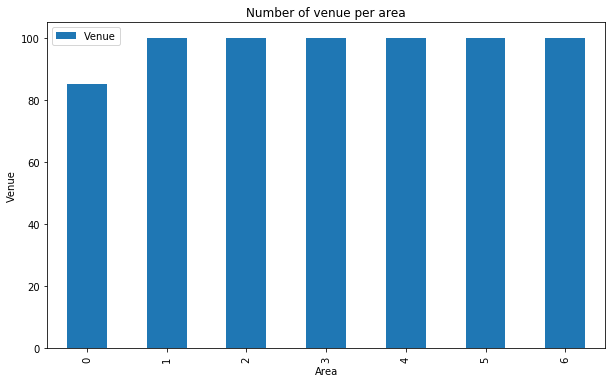

In [100]:
# let's plot data to see
df_new2.plot(kind='bar', figsize=(10, 6))

plt.xlabel('Area') # add to x-label to the plot
plt.ylabel('Venue') # add y-label to the plot
plt.title('Number of venue per area') # add title to the plot

plt.show()

These dense areas are also packed with a lot of venues.  Which is expected. 

In [101]:

# one hot encoding
chi_onehot = pd.get_dummies(chicago_venues_new[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
chi_onehot['Area'] = chicago_venues_new['Area'] 

# move neighborhood column to the first column
fixed_columnss = [chi_onehot.columns[-1]] + list(chi_onehot.columns[:-1])
chi_onehot = chi_onehot[fixed_columnss]

chi_onehot.head()


,Area,Afghan Restaurant,African Restaurant,American Restaurant,Antique Shop,Arcade,Art Gallery,Arts & Crafts Store,Asian Restaurant,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Baseball Stadium,Beach,Beer Bar,Big Box Store,Bike Shop,Board Shop,Bookstore,Boutique,Bowling Alley,Brazilian Restaurant,Breakfast Spot,Brewery,Bubble Tea Shop,Burger Joint,Café,Cajun / Creole Restaurant,Camera Store,Caribbean Restaurant,Chinese Restaurant,Chocolate Shop,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,Comedy Club,Comic Shop,Concert Hall,Convenience Store,Cosmetics Shop,Cuban Restaurant,Cupcake Shop,Cycle Studio,Deli / Bodega,Dessert Shop,Diner,Discount Store,Dive Bar,Dog Run,Donut Shop,Eastern European Restaurant,Empanada Restaurant,Ethiopian Restaurant,Farmers Market,Fast Food Restaurant,Field,Fish & Chips Shop,Fish Market,Food & Drink Shop,Food Truck,Fried Chicken Joint,Frozen Yogurt Shop,Furniture / Home Store,Garden,Garden Center,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Golf Course,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Historic Site,History Museum,Hobby Shop,Hookah Bar,Hot Dog Joint,Hotel,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Korean Restaurant,Latin American Restaurant,Lighthouse,Lingerie Store,Liquor Store,Lounge,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Mediterranean Restaurant,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Movie Theater,Museum,Music Venue,New American Restaurant,Nightclub,Non-Profit,Noodle House,Optical Shop,Paper / Office Supplies Store,Park,Performing Arts Venue,Persian Restaurant,Peruvian Restaurant,Pet Store,Pharmacy,Pie Shop,Pizza Place,Playground,Plaza,Poke Place,Print Shop,Pub,Ramen Restaurant,Restaurant,Salad Place,Salon / Barbershop,Sandwich Place,Scandinavian Restaurant,Scenic Lookout,Seafood Restaurant,Shipping Store,Shoe Store,Shopping Mall,Smoke Shop,South American Restaurant,Southern / Soul Food Restaurant,Spa,Sporting Goods Shop,Sports Bar,Steakhouse,Supermarket,Supplement Shop,Sushi Restaurant,Taco Place,Tanning Salon,Tapas Restaurant,Tattoo Parlor,Tea Room,Thai Restaurant,Theater,Thrift / Vintage Store,Toy / Game Store,Trail,Vegetarian / Vegan Restaurant,Video Game Store,Video Store,Vietnamese Restaurant,Weight Loss Center,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio
0,Uptown,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,Uptown,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2,Uptown,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,Uptown,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,Uptown,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

In [102]:
chi_onehot.shape

(685, 174)

In [103]:
chi_grouped = chi_onehot.groupby('Area').mean().reset_index()
chi_grouped


,Area,Afghan Restaurant,African Restaurant,American Restaurant,Antique Shop,Arcade,Art Gallery,Arts & Crafts Store,Asian Restaurant,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Baseball Stadium,Beach,Beer Bar,Big Box Store,Bike Shop,Board Shop,Bookstore,Boutique,Bowling Alley,Brazilian Restaurant,Breakfast Spot,Brewery,Bubble Tea Shop,Burger Joint,Café,Cajun / Creole Restaurant,Camera Store,Caribbean Restaurant,Chinese Restaurant,Chocolate Shop,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,Comedy Club,Comic Shop,Concert Hall,Convenience Store,Cosmetics Shop,Cuban Restaurant,Cupcake Shop,Cycle Studio,Deli / Bodega,Dessert Shop,Diner,Discount Store,Dive Bar,Dog Run,Donut Shop,Eastern European Restaurant,Empanada Restaurant,Ethiopian Restaurant,Farmers Market,Fast Food Restaurant,Field,Fish & Chips Shop,Fish Market,Food & Drink Shop,Food Truck,Fried Chicken Joint,Frozen Yogurt Shop,Furniture / Home Store,Garden,Garden Center,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Golf Course,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Historic Site,History Museum,Hobby Shop,Hookah Bar,Hot Dog Joint,Hotel,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Korean Restaurant,Latin American Restaurant,Lighthouse,Lingerie Store,Liquor Store,Lounge,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Mediterranean Restaurant,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Movie Theater,Museum,Music Venue,New American Restaurant,Nightclub,Non-Profit,Noodle House,Optical Shop,Paper / Office Supplies Store,Park,Performing Arts Venue,Persian Restaurant,Peruvian Restaurant,Pet Store,Pharmacy,Pie Shop,Pizza Place,Playground,Plaza,Poke Place,Print Shop,Pub,Ramen Restaurant,Restaurant,Salad Place,Salon / Barbershop,Sandwich Place,Scandinavian Restaurant,Scenic Lookout,Seafood Restaurant,Shipping Store,Shoe Store,Shopping Mall,Smoke Shop,South American Restaurant,Southern / Soul Food Restaurant,Spa,Sporting Goods Shop,Sports Bar,Steakhouse,Supermarket,Supplement Shop,Sushi Restaurant,Taco Place,Tanning Salon,Tapas Restaurant,Tattoo Parlor,Tea Room,Thai Restaurant,Theater,Thrift / Vintage Store,Toy / Game Store,Trail,Vegetarian / Vegan Restaurant,Video Game Store,Video Store,Vietnamese Restaurant,Weight Loss Center,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio
0,Albany Park,0.011765,0.00,0.011765,0.00,0.00,0.00,0.00,0.035294,0.00,0.00,0.023529,0.00,0.023529,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.011765,0.00,0.00,0.00,0.011765,0.011765,0.00,0.00,0.00,0.047059,0.00,0.00,0.00,0.011765,0.047059,0.00,0.00,0.00,0.023529,0.00,0.00,0.00,0.00,0.00,0.011765,0.011765,0.023529,0.011765,0.00,0.011765,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.011765,0.00,0.00,0.023529,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.011765,0.00,0.00,0.023529,0.011765,0.00,0.00,0.00,0.00,0.011765,0.011765,0.00,0.023529,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.035294,0.011765,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.011765,0.00,0.035294,0.023529,0.00,0.023529,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.035294,0.00,0.011765,0.011765,0.011765,0.011765,0.00,0.047059,0.00,0.00,0.00,0.00,0.023529,0.00,0.011765,0.00,0.00,0.023529,0.011765,0.00,0.011765,0.023529,0.00,0.00,0.00,0.011765,0.00,0.00,0.00,0.00,0.00,0.035294,0.00,0.011765,0.011765,0.00,0.00,0.00,0.00,0.023529,0.00,0.011765,0.00,0.00,0.00,0.00,0.011765,0.023529,0.00,0.00,0.00,0.00,0.011765,0.00,0.00
1,Edgewater,0.000000,0.00,0.010000,0.03,0.00,0.00,0.00,0.040000,0.00,0.00,0.020000,0.00,0.030000,0.00,0.02,0.01,0.00,0.00,0.00,0.01,0.00,0.00,0.000000,0.02,0.00,0.00,0.030000,0.040000,0.00,0.00,0.00,0.000000,0.00,0.00,0.00,0.000000,0.040000,0.00,0.01,0.00,0.000000,0.00,0.00,0.00,0.00,0.01,0.000000,0.020000,0.000000,0.000000,0.00,0.000000,0.00,0.00,0.02,0.00,0.00,0.00,0.00,0.000000,0.00,0.00,0.000000,0.00,0.00,0.01,0.01,0.00,0.00,0.00